
**by: [João Ataíde](https://www.joaoataide.com/)**
___

In [77]:
import cv2
import numpy as np
import imutils
import matplotlib.pyplot as plt

In [78]:
def plt_imshow(title, image):
    # convert the image frame BGR to RGB color space and display it
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.axis('off')
    plt.show()

## **Load Data**

In [79]:
args = {"image": r"D:\Estudos\PyImageSearch\PyImageSearch Gurus\para-repositorio\imagem.jpeg"}

In [80]:
image = cv2.imread(args["image"])
print("Width: %d pixels" % (image.shape[1]))
print("Height: %d pixels" % (image.shape[0]))
print("Channels: %d " % (image.shape[2]))

Width: 1280 pixels
Height: 960 pixels
Channels: 3 


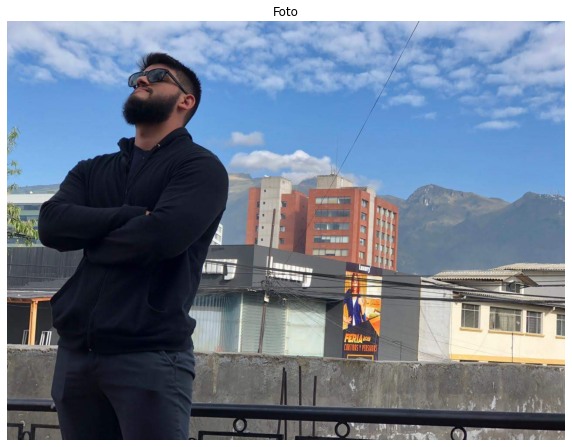

In [81]:
plt_imshow("Foto", image)

## **Translation**

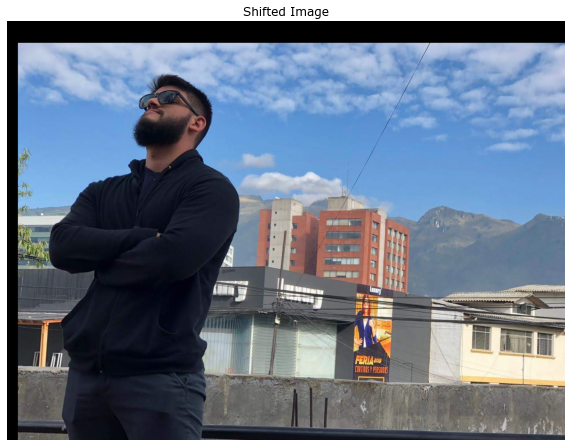

In [82]:
M = np.float32([[1, 0, 25], [0, 1, 50]])
shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
plt_imshow("Shifted Image", shifted)

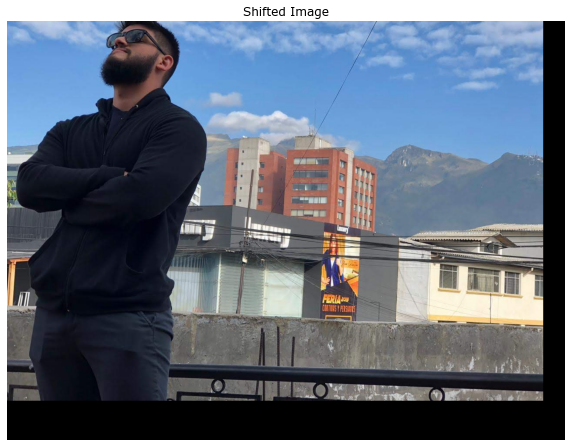

In [83]:
M = np.float32([[1, 0, -50], [0, 1, -90]])
shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
plt_imshow("Shifted Image", shifted)

### **Usando Imutils**

In [84]:
def translate(image, x, y):
    M = np.float32([[1, 0, x], [0, 1, y]])
    shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))

    return shifted

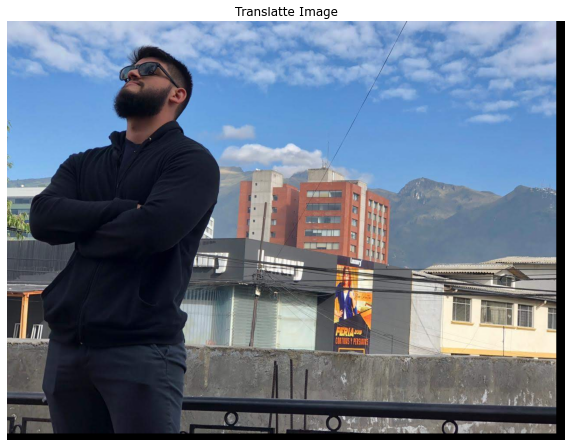

In [85]:
tranlatte_image = translate(image, -20, -15)
plt_imshow("Translatte Image", tranlatte_image)

## **Rotation**

In [86]:
(h, w) = image.shape[:2]
(cX, cY) = (w//2 , h // 2)

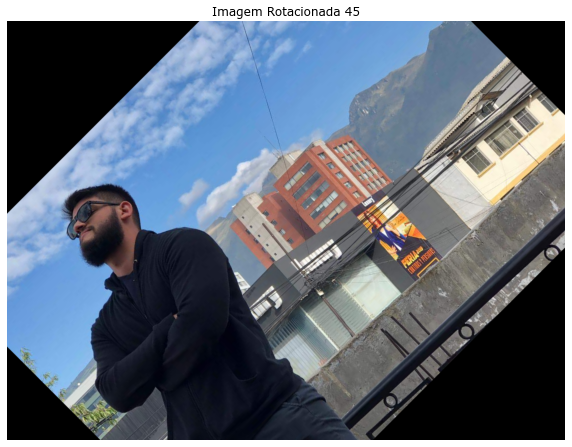

In [87]:
alfa = 45
M = cv2.getRotationMatrix2D((cX, cY), alfa, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
plt_imshow(f"Imagem Rotacionada {alfa}", rotated)

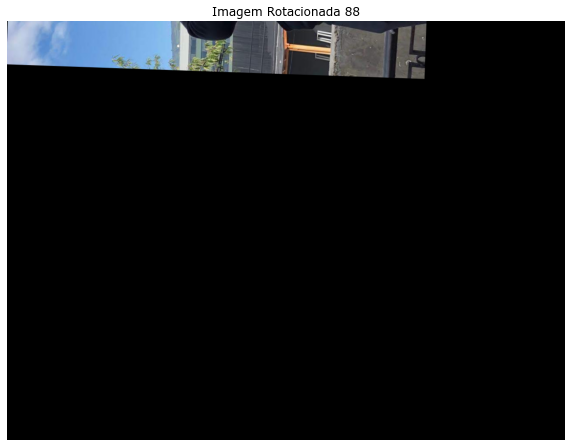

In [88]:
alfa = 88
M = cv2.getRotationMatrix2D((50,50), alfa, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
plt_imshow(f"Imagem Rotacionada {alfa}", rotated)

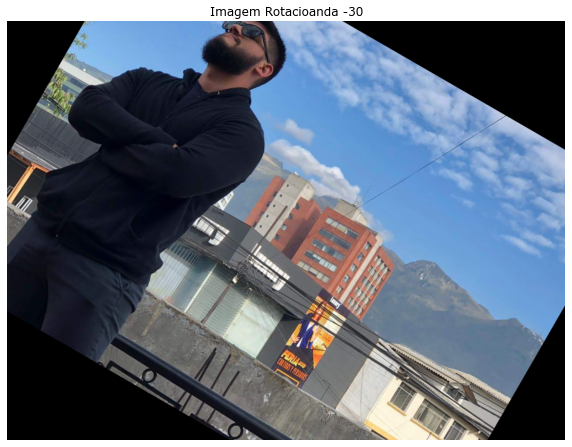

In [89]:
angles = -30
roteted = imutils.rotate(image, angles)
plt_imshow(f"Imagem Rotacioanda {angles}", roteted)

## **Resizing**

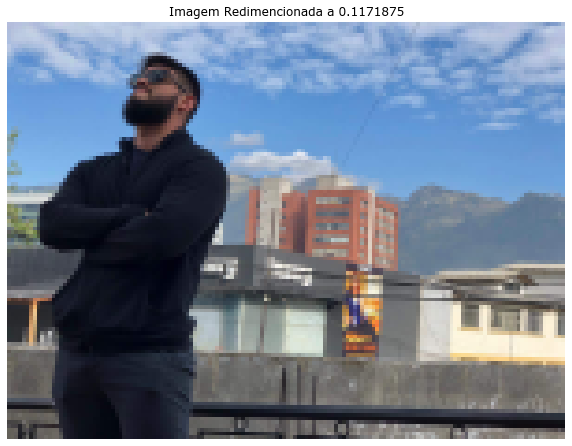

In [90]:
r = 150 / image.shape[1]
dim = (150, int(image.shape[0] * r))
resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
plt_imshow(f"Imagem Redimencionada a {r}", resized)

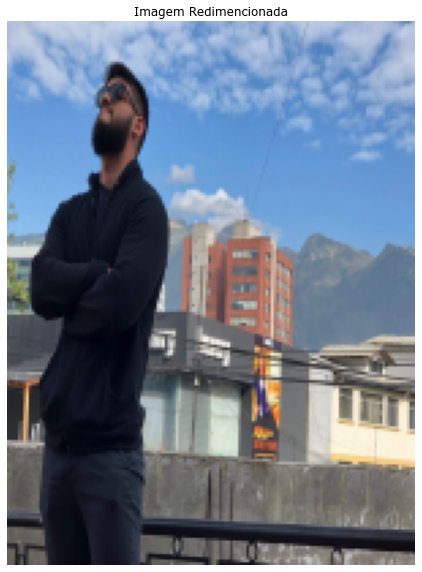

In [91]:
r = 150.0 / image.shape[0]
dim = (150, int(image.shape[1] * r))
resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
plt_imshow(f"Imagem Redimencionada", resized)

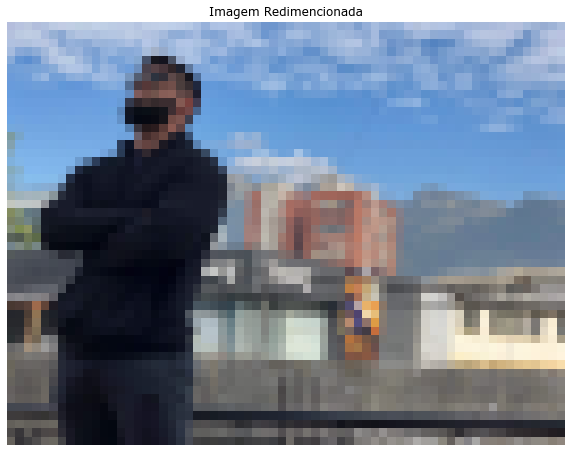

In [92]:
r = 50.0 / image.shape[0]
dim = (int(image.shape[1] * r), 50)
resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
plt_imshow(f"Imagem Redimencionada", resized)

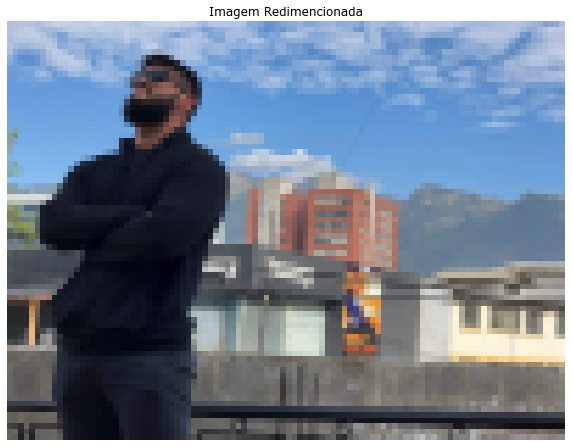

In [93]:
resized = imutils.resize(image, width=100)
plt_imshow("Imagem Redimencionada", resized)

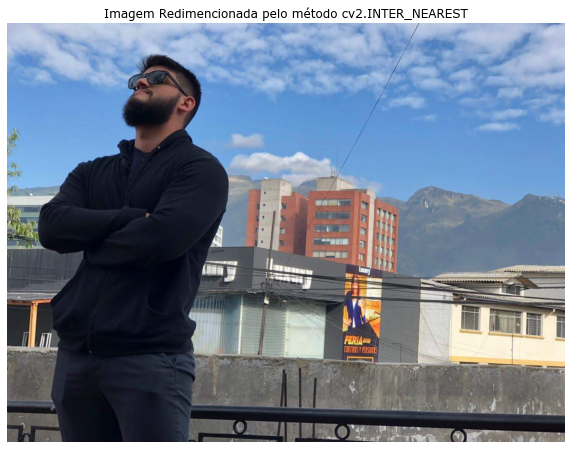

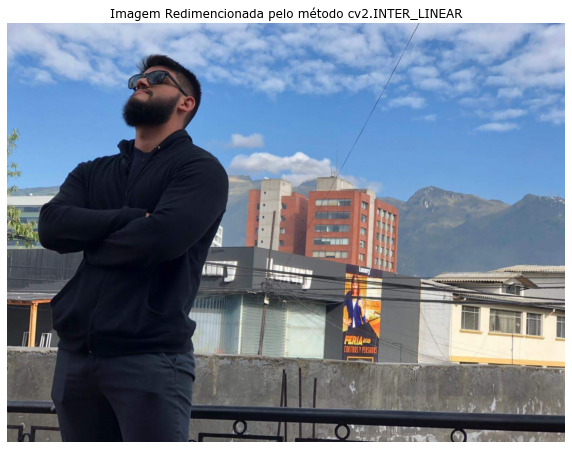

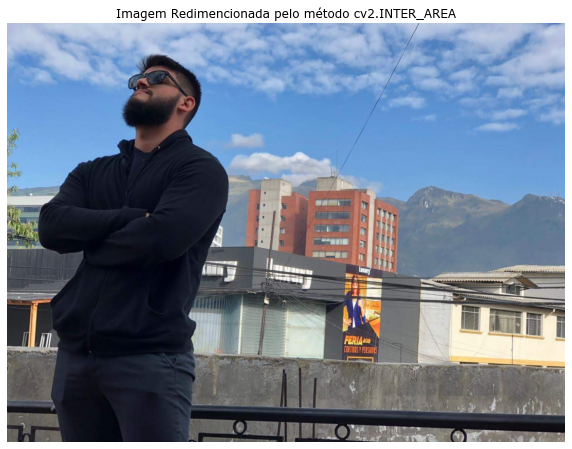

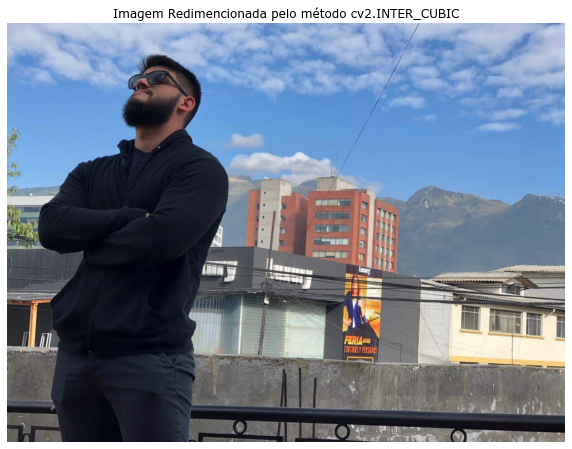

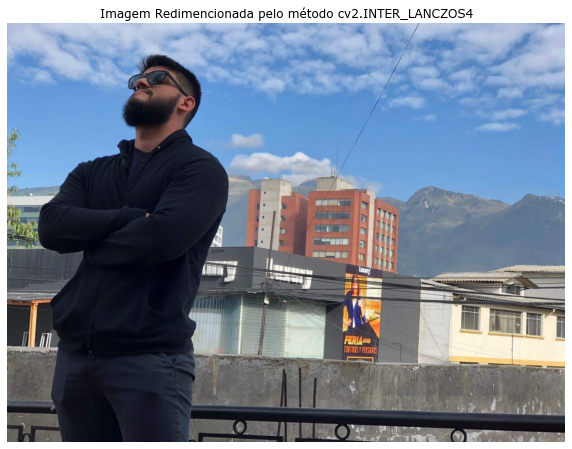

In [94]:
# construct the list of interpolation methods
methods = [
    ("cv2.INTER_NEAREST", cv2.INTER_NEAREST),
    ("cv2.INTER_LINEAR", cv2.INTER_LINEAR),
    ("cv2.INTER_AREA", cv2.INTER_AREA),
    ("cv2.INTER_CUBIC", cv2.INTER_CUBIC),
    ("cv2.INTER_LANCZOS4", cv2.INTER_LANCZOS4)]


# loop over the interpolation methods
for (name, method) in methods:
    # increase the size of the image by 3x using the current interpolation
    # method
    resized = imutils.resize(image, width = image.shape[1] * 3, inter=method)
    plt_imshow(f"Imagem Redimencionada pelo método {name}", resized)

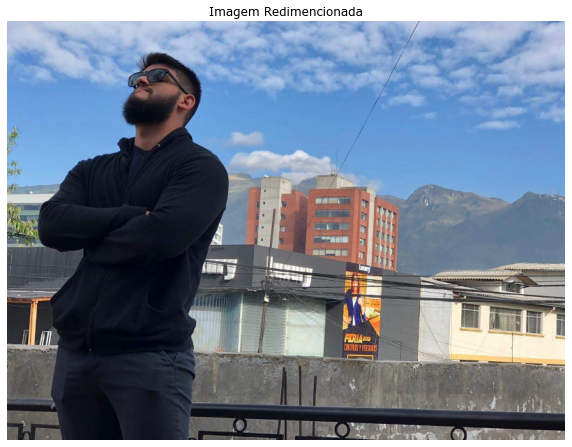

In [95]:
r = 600 / image.shape[0]
dim = (int(image.shape[1] * r), int(image.shape[0] * r))
resized = cv2.resize(image, dim, interpolation = cv2.INTER_CUBIC)
plt_imshow(f"Imagem Redimencionada", resized)

In [96]:
#Taje de bands red green blue to have coordenat (40, 40)
(b, g, r) = resized[367, 170]
print(f"The value at band Red is {r}, Green is {g} and Blue is {b}")

The value at band Red is 5, Green is 9 and Blue is 20


## **Fliping**

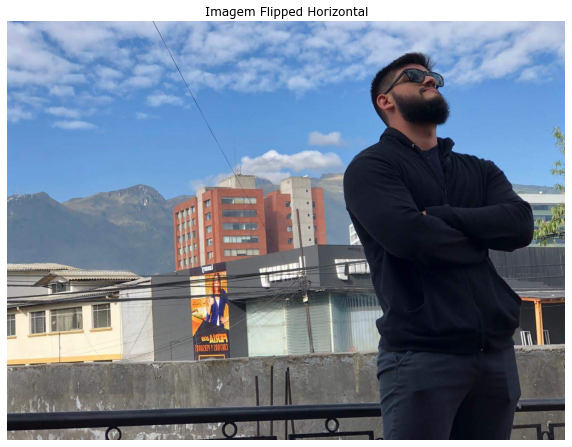

In [97]:
flipped = cv2.flip(image, 1)
plt_imshow("Imagem Flipped Horizontal", flipped)

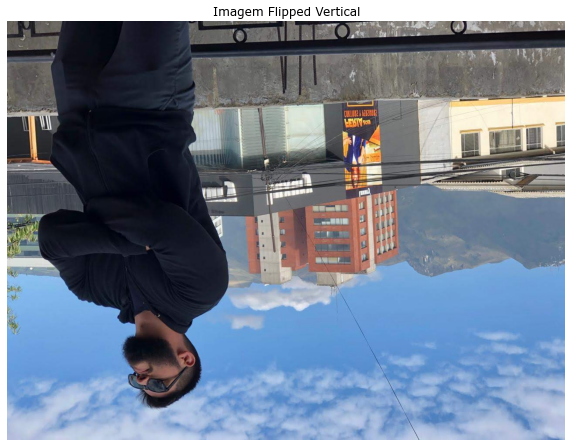

In [98]:
flipped = cv2.flip(image, 0)
plt_imshow("Imagem Flipped Vertical", flipped)

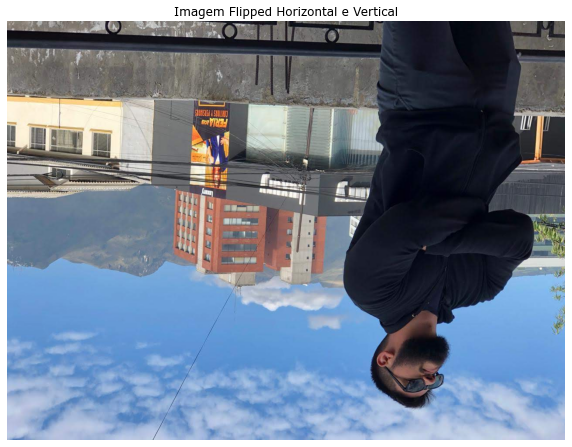

In [99]:
flipped = cv2.flip(image, -1)
plt_imshow("Imagem Flipped Horizontal e Vertical", flipped)

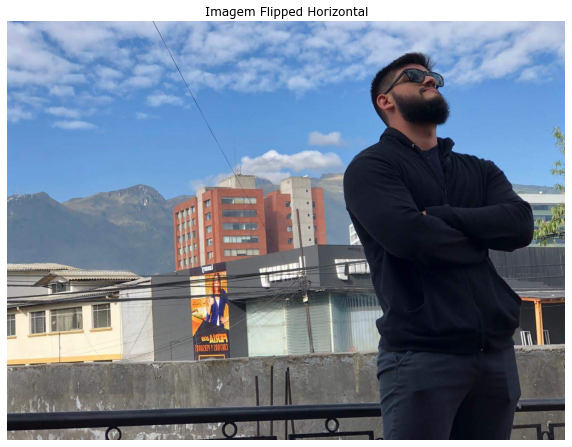

The value at band Red is 99, Green is 150 and Blue is 215


In [100]:
flipped = cv2.flip(image, 1)
plt_imshow("Imagem Flipped Horizontal", flipped)

#Taje de bands red green blue to have coordenat (40, 40)
(b, g, r) = flipped[235, 259]
print(f"The value at band Red is {r}, Green is {g} and Blue is {b}")

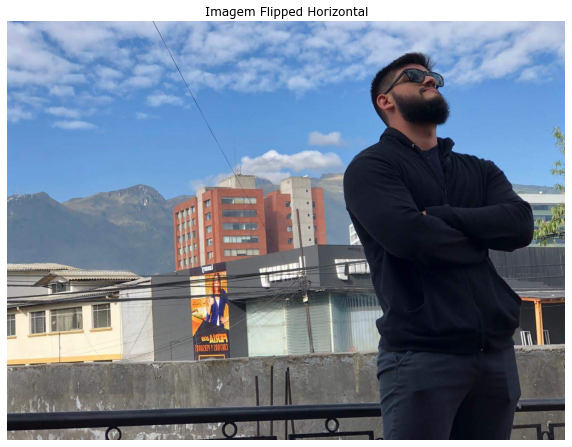

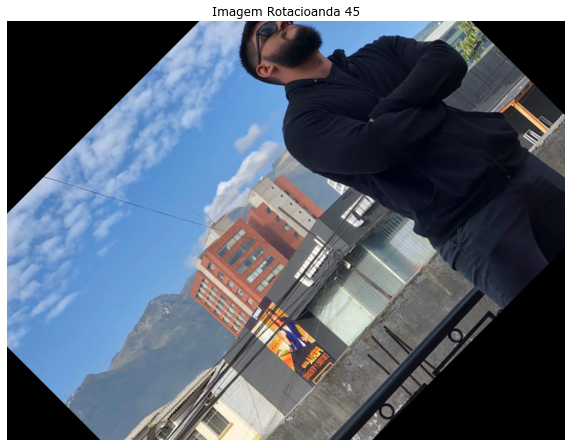

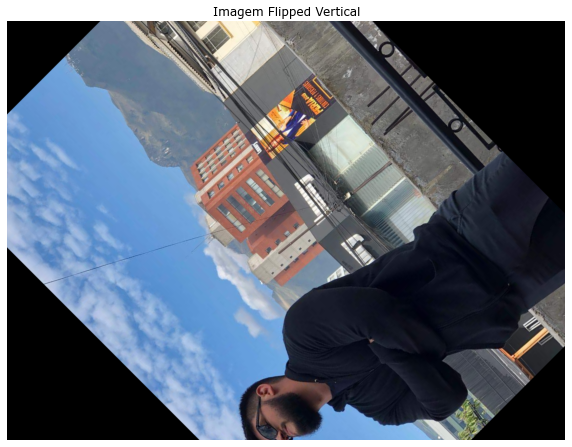

The value at band Red is 103, Green is 124 and Blue is 145


In [101]:
flipped_h = cv2.flip(image, 1)
plt_imshow("Imagem Flipped Horizontal", flipped_h)

angles = 45
roteted_45 = imutils.rotate(flipped_h, angles)
plt_imshow(f"Imagem Rotacioanda {angles}", roteted_45)

flipped_v = cv2.flip(roteted_45, 0)
plt_imshow("Imagem Flipped Vertical", flipped_v)

#Taje de bands red green blue to have coordenat (40, 40)
(b, g, r) =flipped_v[189, 441]
print(f"The value at band Red is {r}, Green is {g} and Blue is {b}")

## **Cropping**

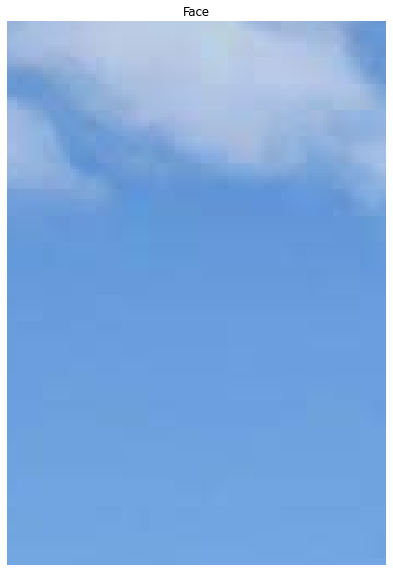

In [102]:
face = image[85:250, 85:200]
plt_imshow("Face", face)

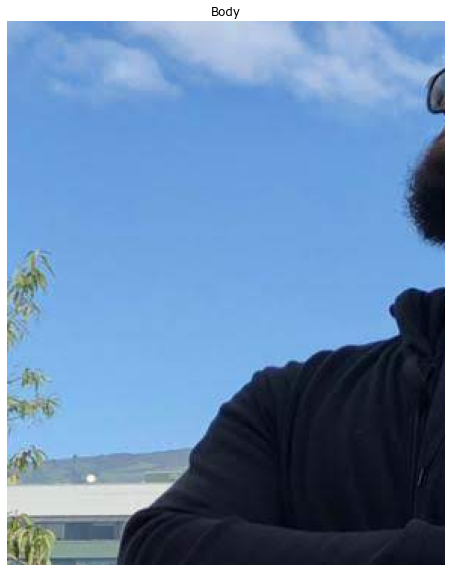

In [103]:
face = image[90:450, 0:290]
plt_imshow("Body", face)

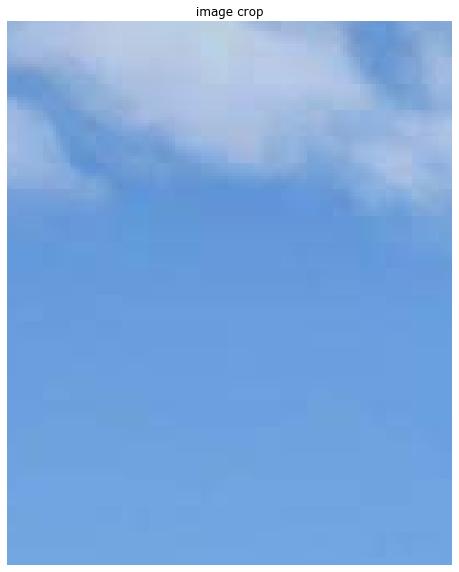

In [104]:
#face = image[startY:endY, statX, endX]
crop = image[85:250, 85:220]
plt_imshow("image crop", crop)

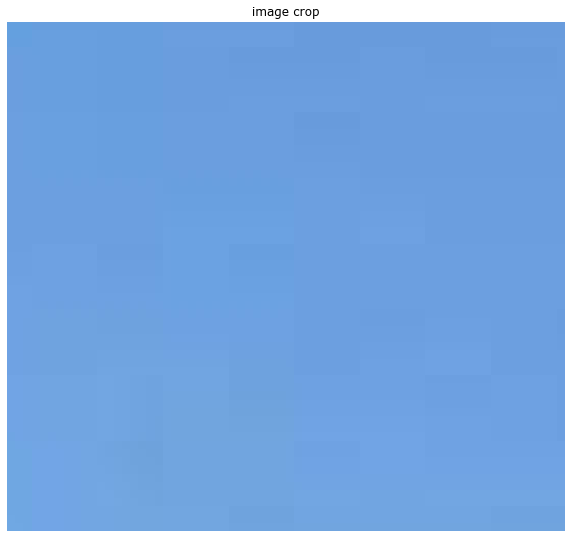

In [105]:
#face = image[startY:endY, statX, endX]
crop = image[173:235, 13:81]
plt_imshow("image crop", crop)

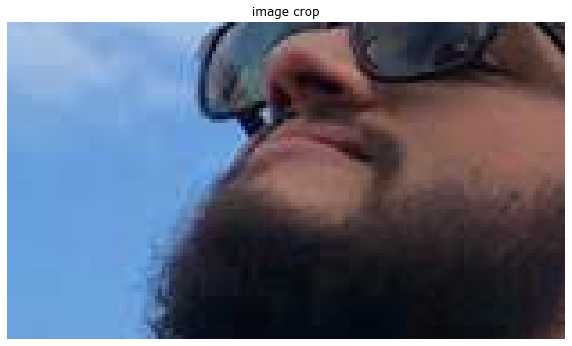

In [106]:
#face = image[startY:endY, statX, endX]
crop = image[124:212, 225:380]
plt_imshow("image crop", crop)

## **Arithmetic**

In [107]:
args = {"image": r"D:\Estudos\PyImageSearch\PyImageSearch Gurus\para-repositorio\imagem2.jpg"}
image = cv2.imread(args["image"])

In [108]:
print("max of 255: {}".format(str(cv2.add(np.uint8([200]), np.uint8([100])))))
print("min of 0: {}".format(str(cv2.subtract(np.uint8([50]), np.uint8([100])))))

print("wrap around: {}".format(str(np.uint8([200]) + np.uint8([100]))))
print("wrap around: {}".format(str(np.uint8([50]) - np.uint8([100]))))

max of 255: [[255]]
min of 0: [[0]]
wrap around: [44]
wrap around: [206]


### **Add**

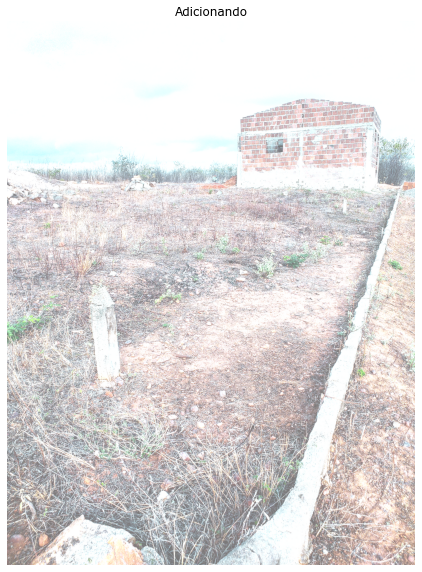

In [109]:
M = np.ones(image.shape, dtype ="uint8") * 100
added = cv2.add(image, M)
plt_imshow("Adicionando", added)

### **Subtract**

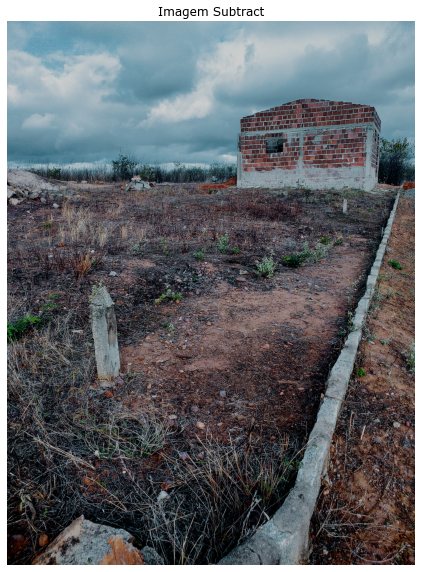

In [110]:
M =  np.ones(image.shape, dtype = 'uint8') * 50
subtracted = cv2.subtract(image, M)
plt_imshow("Imagem Subtract", subtracted)

In [111]:
print("max of 255: {}".format(str(cv2.add(np.uint8([200]), np.uint8([68])))))
print("min of 0: {}".format(str(cv2.subtract(np.uint8([1]), np.uint8([251])))))

print("wrap around: {}".format(str(np.uint8([200]) + np.uint8([68]))))
print("wrap around: {}".format(str(np.uint8([1]) - np.uint8([251]))))

max of 255: [[255]]
min of 0: [[0]]
wrap around: [12]
wrap around: [6]


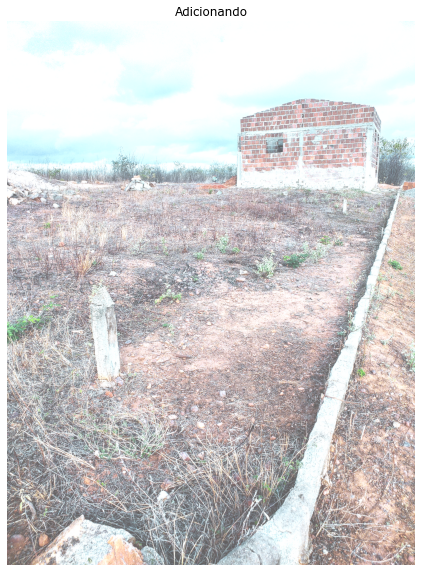

The value at band Red is 253, Green is 255 and Blue is 255


In [112]:
M = np.ones(image.shape, dtype ="uint8") * 75
added = cv2.add(image, M)
plt_imshow("Adicionando", added)

(b, g, r) =added[152, 61]
print(f"The value at band Red is {r}, Green is {g} and Blue is {b}")

## **Bitwise Operations**

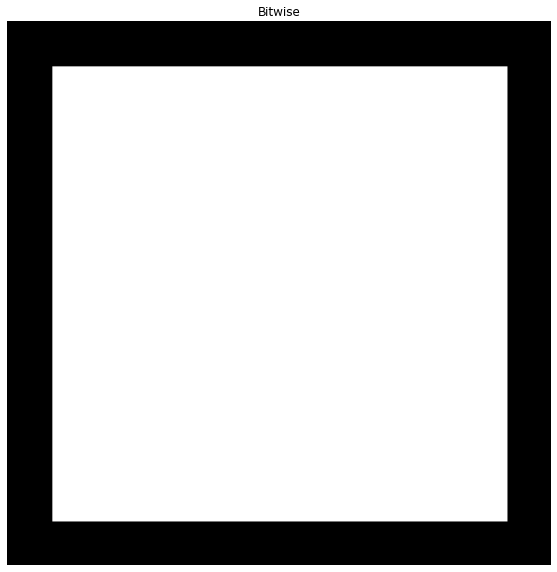

In [113]:
rectangle = np.zeros((300, 300), dtype = 'uint8')
cv2.rectangle(rectangle, (25, 25), (275, 275), 255, -1)
plt_imshow("Bitwise", rectangle)

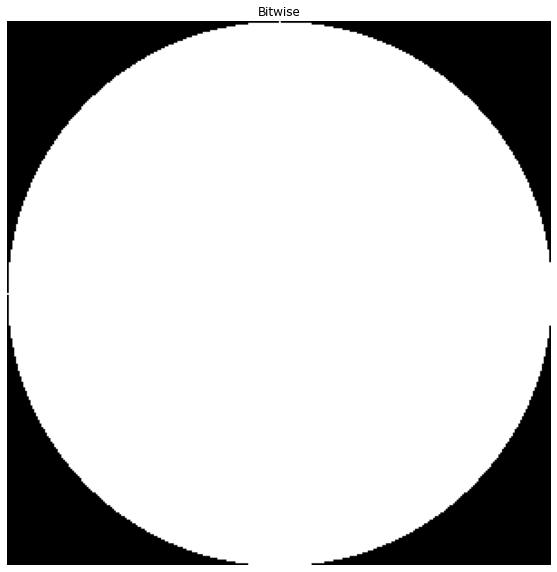

In [114]:
circle = np.zeros((300, 300), dtype = 'uint8')
cv2.circle(circle, (150, 150), 150, 255, -1)
plt_imshow("Bitwise", circle)

### **Bitwise And**

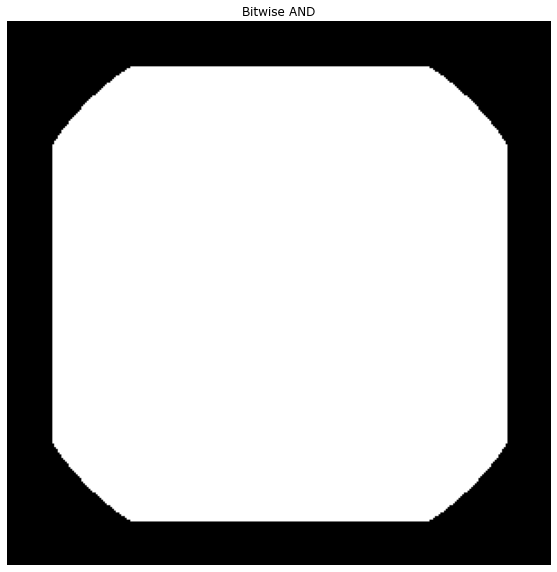

In [115]:
bitwise_and = cv2.bitwise_and(rectangle, circle)
plt_imshow("Bitwise AND", bitwise_and)

### **Bitwise Or**

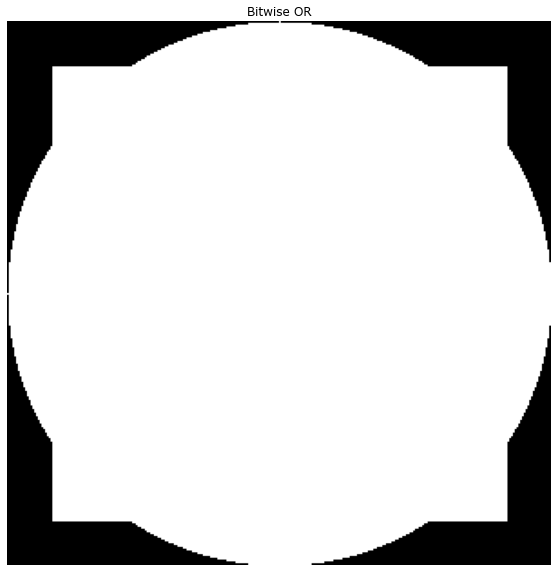

In [116]:
bitwise_or = cv2.bitwise_or(rectangle, circle)
plt_imshow("Bitwise OR", bitwise_or)

### **Bitwise Xor**

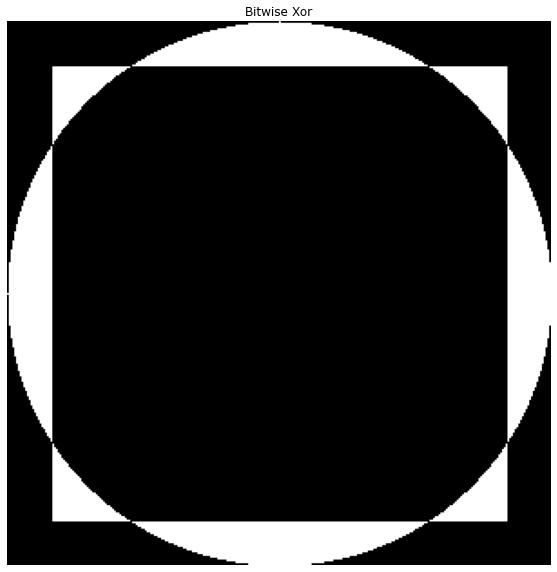

In [117]:
bitwise_xor = cv2.bitwise_xor(rectangle, circle)
plt_imshow("Bitwise Xor", bitwise_xor)

### **Bitwise Not**

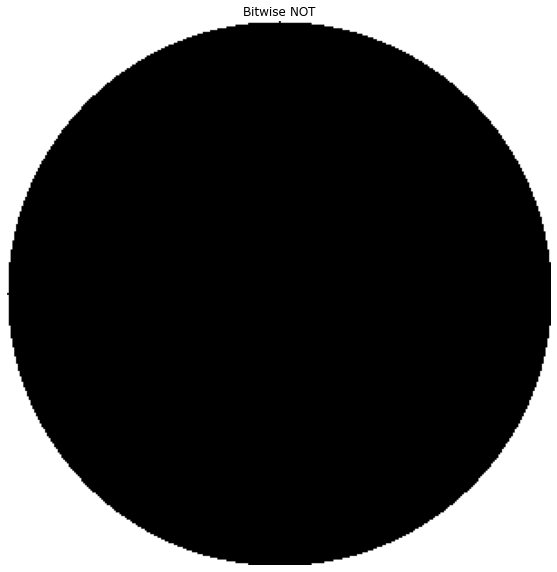

In [118]:
bitwise_not = cv2.bitwise_not(circle)
plt_imshow("Bitwise NOT", bitwise_not)

## **Masking**

In [131]:
args = {"image": r"D:\Estudos\PyImageSearch\PyImageSearch Gurus\para-repositorio\imagem.jpeg"}
image = cv2.imread(args["image"])

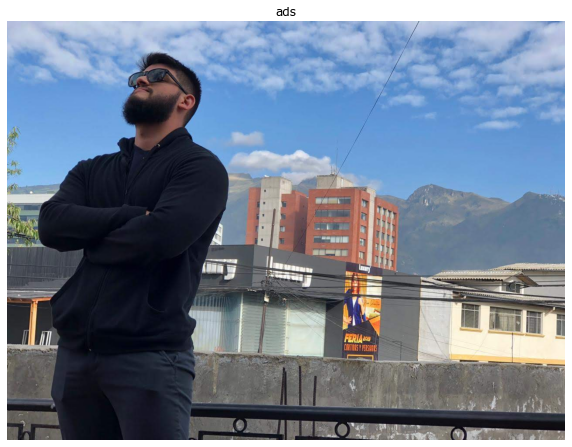

In [132]:
plt_imshow("ads", image)

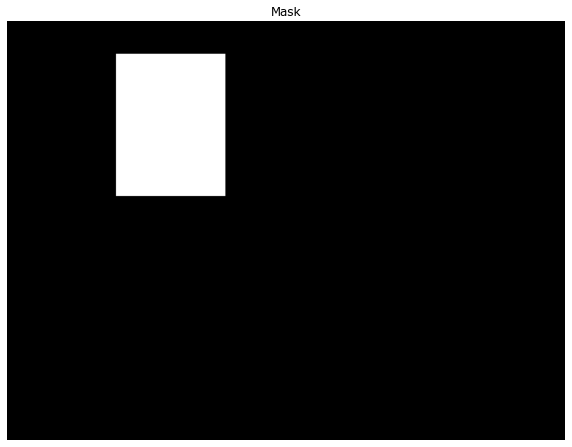

In [143]:
mask = np.zeros(image.shape[:2], dtype = 'uint8')
cv2.rectangle(mask, (250,75), (500, 400), 255, -1)
plt_imshow("Mask", mask)

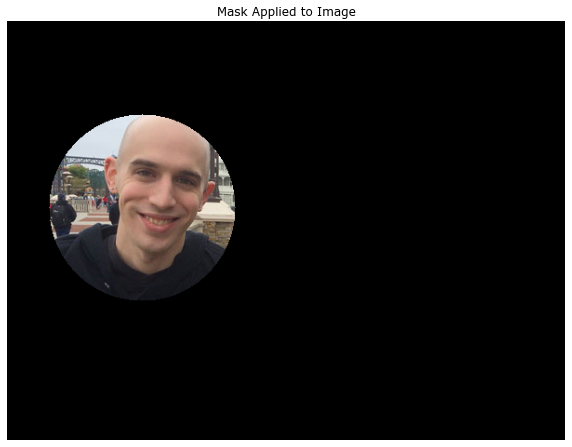

In [124]:
masked = cv2.bitwise_and(image, image, mask = mask)
plt_imshow("Mask Applied to Image", masked)

## **Splitting and merging channels**

In [146]:
(B, G, R) = cv2.split(image)
bands = {"Blue":B, "Green":G, "Red":R}

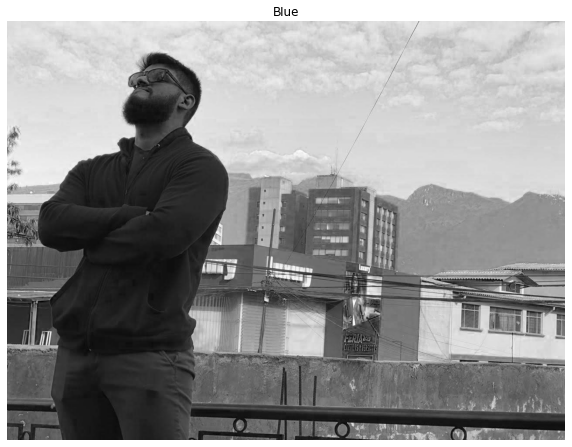

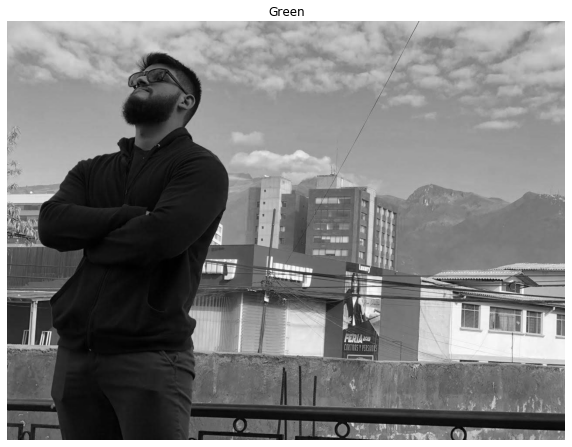

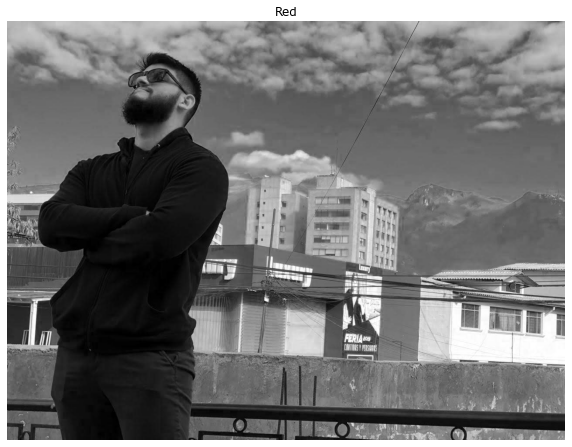

In [147]:
for chanals in bands.keys():
    #print(chanals)
    chan = bands[chanals]

    plt_imshow(f"{chanals}", chan)

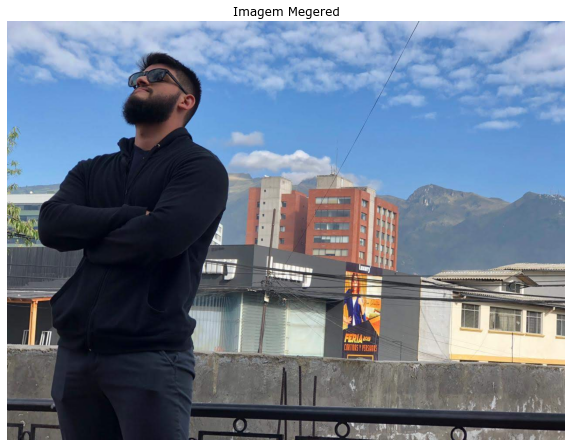

In [148]:
merged = cv2.merge([B, G, R])
plt_imshow("Imagem Megered", merged)

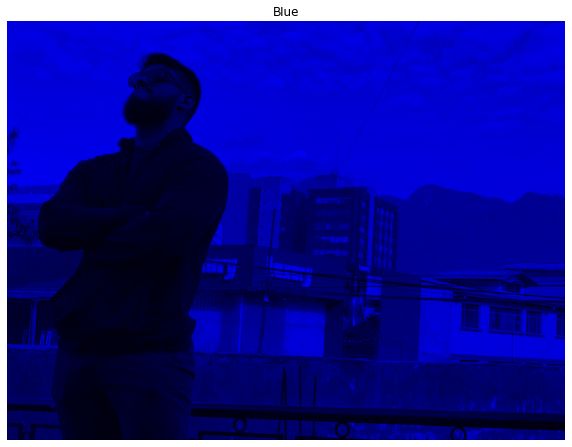

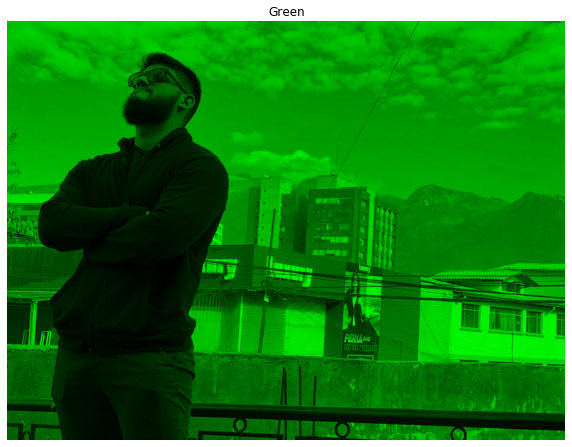

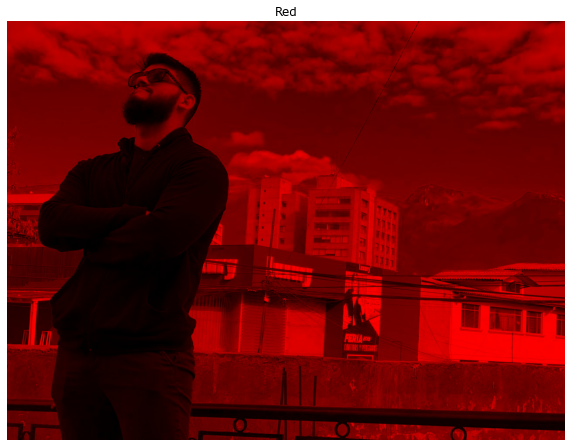

In [149]:
zeros = np.zeros(image.shape[:2], dtype = 'uint8')

merged_red = cv2.merge([zeros, zeros, R])
merged_green = cv2.merge([zeros, G, zeros])
merged_blues = cv2.merge([B, zeros, zeros])

lista_merged = {"Blue":merged_blues, "Green":merged_green, "Red":merged_red}

for chanals in lista_merged.keys():
    #print(chanals)
    merged
    chan = lista_merged[chanals]

    plt_imshow(f"{chanals}", chan)